In [1]:
# =======================
# COMMON FUNCTIONS
# =======================
import numpy as np
import tarfile

def loadTGZ(tgz, fPath, dtype, skip_header=False):
    """
    Load a CSV file from the tarfile 'tgz' given its file path 'fPath'.  
    Optionally skip the header row (if skip_header=True). 
    Reshape the data into 256*256 and cast to the specified dtype.
    """
    with tgz.extractfile(fPath) as csvfile:
        data = np.genfromtxt(csvfile, delimiter=",", skip_header=1 if skip_header else 0)
        if data.size != 256*256:
            raise ValueError(f"Data size mismatch in {fPath}: expected {256*256}, got {data.size}")
        return data.reshape(256*256).astype(dtype)

def removeMaskNaN(outSet):
    """Remove entries with NaN in any file and entries with mask != 0."""
    aMask = (outSet["mask"] == 0)
    for k in outSet.keys():
        aMask &= ~np.isnan(outSet[k])
    for k in outSet.keys():
        outSet[k] = outSet[k][aMask]
    return outSet

def normSet(outSet):
    """
    Normalize the variables in a consistent way (using a sensor-specific offset)
    to allow comparisons between sensors.
    """
    offset = np.mean(outSet["tMean0"]).astype(np.float16)
    outSet["tMean0"] = (outSet["tMean0"] - offset) / 75.
    outSet["tMeanF"] = (outSet["tMeanF"] - (offset + 150)) / 75.
    outSet["tWidth0"] = (outSet["tWidth0"] - 10) / 7.5
    outSet["tWidthF"] = (outSet["tWidthF"] - 10) / 7.5
    return outSet

# =======================
# CELL 1: OLD DATA LOADING
# =======================
tgzFileName = "ASideFirstModules.tgz"

# Define module training list for old data
moduleFiles = [
    "equalisation_M98_A1",
    "equalisation_M94_A2",
    "equalisation_M96_A3",
    "equalisation_M59_A4",
    "equalisation_N22_A5",
    "equalisation_M116_A6",
    "equalisation_N030_A7",
    "equalisation_M90_A8",
    "equalisation_N029_A9",
    "equalisation_N013_A10"
]

# Define training set (to be excluded from evaluation)
trainingSet = [
    ("equalisation_N030_A7","VP0-1"), #offset = 2
    ("equalisation_M59_A4","VP0-0"), #offset = 1
    ("equalisation_M98_A1","VP0-1"), #offset = 0
    ("equalisation_N030_A7","VP3-2"), #offset = -1
    ("equalisation_M98_A1","VP2-0") #offset = -2
]

vpList = [f"VP{i}-{j}" for i in range(4) for j in range(3)]
evaluationSet = [(f, vp) for f in moduleFiles for vp in vpList]
evaluationSet = [s for s in evaluationSet if s not in trainingSet]

print(f"Old Data:\n Training set: {trainingSet}\n {len(evaluationSet)} evaluation sets to test.")
print("First:", evaluationSet[0], "Last:", evaluationSet[-1])

def extractFromTGZ(tgzName, dSet):
    """
    Extract the old data files for a given dataset dSet.
    dSet is a tuple: (module_name, vp), e.g. ("equalisation_M98_A1", "VP0-1").
    """
    path = dSet[0] + "/"
    outSet = {}
    with tarfile.open(tgzName, 'r:gz') as tgz:
        outSet["tMean0"] = loadTGZ(tgz, path + f"Module0_{dSet[1]}_Trim0_Noise_Mean.csv", np.float16)
        outSet["tMeanF"] = loadTGZ(tgz, path + f"Module0_{dSet[1]}_TrimF_Noise_Mean.csv", np.float16)
        outSet["tWidth0"] = loadTGZ(tgz, path + f"Module0_{dSet[1]}_Trim0_Noise_Width.csv", np.float16)
        outSet["tWidthF"] = loadTGZ(tgz, path + f"Module0_{dSet[1]}_TrimF_Noise_Width.csv", np.float16)
        outSet["mask"]    = loadTGZ(tgz, path + f"Module0_{dSet[1]}_Matrix_Mask.csv", np.float16)
        outSet["trim"]    = loadTGZ(tgz, path + f"Module0_{dSet[1]}_Matrix_Trim.csv", np.int8)
    return removeMaskNaN(outSet)


Old Data:
 Training set: [('equalisation_N030_A7', 'VP0-1'), ('equalisation_M59_A4', 'VP0-0'), ('equalisation_M98_A1', 'VP0-1'), ('equalisation_N030_A7', 'VP3-2'), ('equalisation_M98_A1', 'VP2-0')]
 115 evaluation sets to test.
First: ('equalisation_M98_A1', 'VP0-0') Last: ('equalisation_N013_A10', 'VP3-2')


In [2]:
# =======================
# CELL 2: NEW OPERATIONAL DATA LOADING
# =======================
tgzFileName_new = "Module25_20230621_trim.tgz"

# For the new data, the module prefix is fixed as "Module25".
evaluationSet_new = [("Module25", vp) for vp in vpList]

print(f"\nNew Operational Data:\n {len(evaluationSet_new)} evaluation sets to test.")
print("First:", evaluationSet_new[0], "Last:", evaluationSet_new[-1])

def extractFromTGZ_new(tgzName, dSet) :
    """
    Extract the new operational data files for a given dataset dSet.
    dSet is a tuple: (module_prefix, vp), e.g. ("Module25", "VP0-0").
    For noise files, we skip the header row; for matrix files, we do not.
    """
    module_prefix, vp = dSet
    outSet = {}
    with tarfile.open(tgzName, 'r:gz') as tgz:
        # Noise files (skip header)
        outSet["tMean0"] = loadTGZ(tgz, f"{module_prefix}_{vp}_Trim0_Noise_Mean_2023-06-21_14-06-30.csv", np.float16, skip_header=True)
        outSet["tMeanF"] = loadTGZ(tgz, f"{module_prefix}_{vp}_TrimF_Noise_Mean_2023-06-21_14-06-30.csv", np.float16, skip_header=True)
        outSet["tWidth0"] = loadTGZ(tgz, f"{module_prefix}_{vp}_Trim0_Noise_Width_2023-06-21_14-06-30.csv", np.float16, skip_header=True)
        outSet["tWidthF"] = loadTGZ(tgz, f"{module_prefix}_{vp}_TrimF_Noise_Width_2023-06-21_14-06-30.csv", np.float16, skip_header=True)
        # Matrix files (do not skip header)
        outSet["mask"] = loadTGZ(tgz, f"{module_prefix}_{vp}_Matrix_Mask_2023-06-21_14-06-30.csv", np.float16, skip_header=False)
        outSet["trim"] = loadTGZ(tgz, f"{module_prefix}_{vp}_Matrix_Trim_2023-06-21_14-06-30.csv", np.int8, skip_header=False)
    return removeMaskNaN(outSet)


New Operational Data:
 12 evaluation sets to test.
First: ('Module25', 'VP0-0') Last: ('Module25', 'VP3-2')


In [3]:
from matplotlib import pyplot as plt

# Now plot the data to see what we have as a training set

def plotCorr(ax,trim,val,ytitle):
    xBins = np.arange(-0.5,15.5,1)
    yBins = np.linspace(np.min(val),np.max(val),100)
    ax.hist2d(trim,val,bins=[xBins,yBins])
    ax.set_xlabel('Final Trim')
    ax.set_ylabel(ytitle)

def drawSet(dSet, title='Dataset', norm=False):
    fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1,5, figsize=(14,3))
    fig.suptitle(title)
    # final Trim
    ax1.hist(dSet["trim"],bins=np.arange(-0.5,15.5))
    ax1.set_xlabel('Final Trim')
    # mean0 & F
    if norm :
        bins = np.linspace(-2,2,128)
    else :
        bins = np.linspace(-0.5,2047.5,128)
    ax2.hist(dSet["tMean0"], bins=bins, label = "0 Mean")
    ax2.legend()
    ax2.set_yscale('log')
    ax2.set_xlabel('Mean 0')
    ax3.hist(dSet["tMeanF"], bins=bins, label = "F Mean")
    ax3.legend()
    ax3.set_yscale('log')
    ax3.set_xlabel('Mean F')
    # widths
    if norm :
        bins = np.linspace(-2,2,128)
    else :
        bins = np.linspace(-0.5,25.5, 26)
    ax4.hist(dSet["tWidth0"], bins=bins, label = "0 Width")
    ax4.legend()
    ax4.set_yscale('log')
    ax4.set_xlabel('Width 0')
    ax5.hist(dSet["tWidthF"], bins=bins, label = "F Width")
    ax5.legend()
    ax5.set_yscale('log')
    ax5.set_xlabel('Width F')
    plt.tight_layout()
    plt.show()
    # now correlations
    fig, (ax0, ax1, ax2, ax3) = plt.subplots(1,4, figsize=(12,3))
    plotCorr(ax0,dSet["trim"],dSet["tMean0"],'Mean 0')
    plotCorr(ax1,dSet["trim"],dSet["tMeanF"],'Mean F')
    plotCorr(ax2,dSet["trim"],dSet["tWidth0"],'Width 0')
    plotCorr(ax3,dSet["trim"],dSet["tWidthF"],'Width F')
    plt.tight_layout()
    plt.show()

def drawSetwMask(dSet, title='Dataset', norm=False):
    # Create a figure with 6 subplots in one row
    fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(17, 3))
    fig.suptitle(title)
    
    # Plot for mask distribution
    ax1.hist(dSet["mask"], bins=50, color='gray')
    ax1.set_xlabel("Mask")
    ax1.set_ylabel("Frequency")
    
    # Histogram for final Trim
    ax2.hist(dSet["trim"], bins=np.arange(-0.5, 15.5, 1), color='C0')
    ax2.set_xlabel('Final Trim')
    
    # Plot for tMean0
    if norm:
        bins = np.linspace(-2, 2, 128)
    else:
        bins = np.linspace(-0.5, 2047.5, 128)
    ax3.hist(dSet["tMean0"], bins=bins, label="0 Mean", color='C1')
    ax3.legend()
    ax3.set_yscale('log')
    ax3.set_xlabel('Mean 0')
    
    # Plot for tMeanF
    ax4.hist(dSet["tMeanF"], bins=bins, label="F Mean", color='C2')
    ax4.legend()
    ax4.set_yscale('log')
    ax4.set_xlabel('Mean F')
    
    # For widths, adjust bins based on normalization flag
    if norm:
        bins = np.linspace(-2, 2, 128)
    else:
        bins = np.linspace(-0.5, 25.5, 26)
    ax5.hist(dSet["tWidth0"], bins=bins, label="0 Width", color='C3')
    ax5.legend()
    ax5.set_yscale('log')
    ax5.set_xlabel('Width 0')
    
    ax6.hist(dSet["tWidthF"], bins=bins, label="F Width", color='C4')
    ax6.legend()
    ax6.set_yscale('log')
    ax6.set_xlabel('Width F')
    
    plt.tight_layout()
    plt.show()
    
    # Now the correlation plots (2D histograms) for each feature vs. trim
    fig, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4, figsize=(12, 3))
    plotCorr(ax0, dSet["trim"], dSet["tMean0"], 'Mean 0')
    plotCorr(ax1, dSet["trim"], dSet["tMeanF"], 'Mean F')
    plotCorr(ax2, dSet["trim"], dSet["tWidth0"], 'Width 0')
    plotCorr(ax3, dSet["trim"], dSet["tWidthF"], 'Width F')
    plt.tight_layout()
    plt.show()

Loaded and normalized training data for: ('equalisation_N030_A7', 'VP0-1')
Loaded and normalized training data for: ('equalisation_M59_A4', 'VP0-0')
Loaded and normalized training data for: ('equalisation_M98_A1', 'VP0-1')
Loaded and normalized training data for: ('equalisation_N030_A7', 'VP3-2')
Loaded and normalized training data for: ('equalisation_M98_A1', 'VP2-0')
Final Combined Training Set Shapes:
tMean0: (326251,)
tMeanF: (326251,)
tWidth0: (326251,)
tWidthF: (326251,)
trim: (326251,)
dataLen = 326251, nVars = 4
5098/5098 ━━━━━━━━━━━━━━━━━━━━ 4s 663us/step - adjacent_accuracy: 0.5021 - loss: 2.7283 - sparse_categorical_accuracy: 0.1820
Initial loss:  2.7276 with the random starting network
Initial accuracy:  0.1725, expect 1/16 = 0.06 by chance
Epoch 1/10000
319/319 ━━━━━━━━━━━━━━━━━━━━ 1s 938us/step - adjacent_accuracy: 0.4951 - loss: 2.5204 - sparse_categorical_accuracy: 0.1768
Epoch 2/10000
319/319 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - adjacent_accuracy: 0.7938 - loss: 1.7096 -

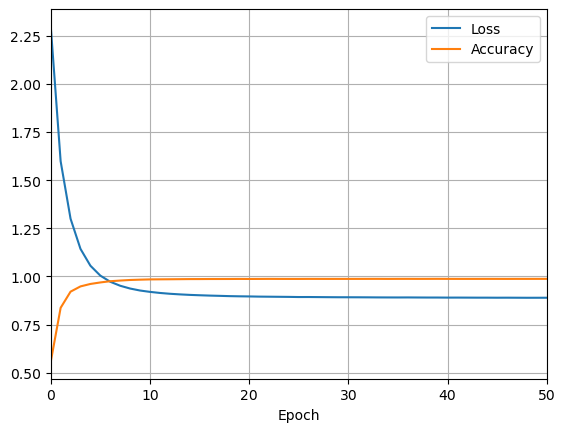

Model trained on {'tMean0': array([-1.693 ,  0.28  ,  1.026 , ...,  0.88  ,  0.28  ,  0.2534],
      dtype=float16), 'tMeanF': array([1.974 , 2.254 , 2.56  , ..., 0.7866, 0.24  , 0.4666], dtype=float16), 'tWidth0': array([ 0.67  , -0.2094, -0.3052, ..., -0.4922, -0.52  , -0.2031],
      dtype=float16), 'tWidthF': array([-0.641 , -0.6357, -0.8   , ..., -0.631 , -0.64  , -0.544 ],
      dtype=float16), 'trim': array([10,  7,  4, ...,  3,  8,  7], dtype=int8)} saved to NN_equalisation_N030_A7_VP0-1.keras
Total training time: 31.55 seconds


In [33]:
from matplotlib import pyplot as plt
# Keras network used as front end to Tensorflow
# See https://keras.io/ for details of the package
# import Keras overall
import keras
# input normalization layer [fixes input variables to useful range]
from keras.layers import BatchNormalization
# a single NN layer of type "Dense" i.e. all inputs connected to all outputs
from keras.layers import Dense
# The input layer, takes x and starts NN processing
from keras.layers import Input
# Keras functional methods for defining a NN model
from keras.models import Model
import time  # Import time module
import keras_tuner as kt
from keras.saving import register_keras_serializable

trainSets = []
for dSet in trainingSet:
    try:
        outSet = extractFromTGZ(tgzFileName, dSet)
        outSet_norm = normSet(outSet)
        trainSets.append(outSet_norm)
        print("Loaded and normalized training data for:", dSet)
    except Exception as e:
        print("Error loading training data for", dSet, ":", e)

# Initialize a dictionary to store combined training data
combined_trainSet = {
    "tMean0": [],
    "tMeanF": [],
    "tWidth0": [],
    "tWidthF": [],
    "trim": []
}

# Merge all normalized datasets into one
for trainSet in trainSets:
    for key in combined_trainSet.keys():
        combined_trainSet[key].extend(trainSet[key])  # Append each dataset

# Convert lists to NumPy arrays
for key in combined_trainSet.keys():
    combined_trainSet[key] = np.array(combined_trainSet[key])

# Print final shape to confirm successful merging
print("Final Combined Training Set Shapes:")
for key, values in combined_trainSet.items():
    print(f"{key}: {values.shape}")

@register_keras_serializable()
def adjacent_accuracy(y_true, y_pred):
    """
    Custom accuracy metric that accepts predictions within ±1 of the true class.
    Args:
        y_true: True labels (integer values).
        y_pred: Predicted probabilities for each class (softmax output).
    Returns:
        Accuracy metric allowing adjacent values.
    """
    import tensorflow.keras.backend as K

    # Get the predicted class (argmax of softmax output)
    y_pred_classes = K.argmax(y_pred, axis=-1)

    # Ensure both tensors are of the same type
    y_true = K.cast(y_true, dtype='float32')  # Cast y_true to float32
    y_pred_classes = K.cast(y_pred_classes, dtype='float32')  # Cast y_pred_classes to float32 

    # Check if predictions are within ±1 of the true labels
    correct = K.abs(y_true - y_pred_classes) <= 1

    # Calculate mean accuracy
    return K.mean(K.cast(correct, dtype='float32'))


#def buildModel(nVal,nLayer,nUnits):
    """Build the model in Keras for nVal input values and nLayer dense layers"""
    # define a Functional keras NN model
    # define input layer
    inputs = Input(shape=(nVal,))
    # first dense layer
    iLayer = Dense(nUnits, activation='tanh')(inputs)
    for _ in range(nLayer-1):
        # input->internal layer with nVal nodes, extra dense layers if required
        iLayer = Dense(nUnits, activation='tanh')(iLayer)
    # prev layer -> output (16 nodes, one for each trim level)
    output = Dense(16, activation='softmax')(iLayer)
    # a model is created from connecting all the layers from input to output
    model = Model(inputs=inputs, outputs=output)
    # Compiling the model sets up how to optimise it
    model.compile(optimizer=keras.optimizers.get("Adam"),  # Specific minimiser routine
                loss=keras.losses.SparseCategoricalCrossentropy(), # define loss function to minimize
                metrics=[keras.metrics.SparseCategoricalAccuracy(), adjacent_accuracy]) # what to store at each step
    return model

import keras
from keras.layers import Input, Dense, LeakyReLU
from keras.models import Model

def buildModel(nVal, nLayer, nUnits):
    """
    Build the model in Keras for nVal input values, nLayer dense layers
    with Leaky ReLU activation, and an output of 16 classes.
    """
    # Define input layer
    inputs = Input(shape=(nVal,))

    # First dense layer with no activation, then LeakyReLU
    x = Dense(nUnits)(inputs)
    x = LeakyReLU(negative_slope=0.1)(x)  # e.g. alpha=0.1

    # Additional hidden layers
    for _ in range(nLayer - 1):
        x = Dense(nUnits)(x)
        x = LeakyReLU(negative_slope=0.1)(x)

    # Output layer: 16 classes with softmax
    outputs = Dense(16, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)

    # Compile the model
    model.compile(
        optimizer=keras.optimizers.Adam(),
        loss=keras.losses.SparseCategoricalCrossentropy(),
        metrics=[
            keras.metrics.SparseCategoricalAccuracy(),
            adjacent_accuracy   # your custom accuracy metric
        ]
    )
    return model


def trainNN(dSet,nLayer,nUnits,saveFile=None):
    """Using the training dataset dSet, make a model, train it and optionally save it"""
    # remove trim from vars as already removed trim!=0 for dataset
    x_all = np.column_stack([dSet["tMean0"], dSet["tMeanF"], \
                             dSet["tWidth0"], dSet["tWidthF"]])
    # Output data to optimise the NN to find is the trim value
    y_all = dSet["trim"]
    # 
    dataLen = x_all.shape[0]
    nVars = x_all.shape[1]
    print(f"dataLen = {dataLen}, nVars = {nVars}")
    # even half as training
    x_data = x_all[::2]
    y_data = y_all[::2]
    # odd half as evaluation
    x_eval = x_all[1::2]
    y_eval = y_all[1::2]
    # make the model
    model = buildModel(nVal=nVars, nLayer=nLayer, nUnits=nUnits)
    # run an evaluation before optimization to see what the random initialization
    # gave as an output
    score = model.evaluate(x_eval, y_eval, verbose=1)
    print('Initial loss: {:7.4f} with the random starting network'.format(score[0]))
    print('Initial accuracy: {:7.4f}, expect 1/16 = 0.06 by chance'.format(score[1]))
    #
    # train the model
    # Choose a batch size
    batchSize = 512
    # Rather than run a fixed number of rounds, stop when the output stops improving
    from keras.callbacks import EarlyStopping
    # stop training early if after N iterations the result has not improved
    early_stopping = EarlyStopping(monitor="loss", patience=5)
    # Now run the optimization, taking events from the generator
    # Start timer
    start_time = time.time()
    # Each epoch is one pass through the data, if not stopped do 20 epochs
    history=model.fit(x=x_data,y=y_data,batch_size=batchSize,verbose=1,epochs=10000,shuffle=True, callbacks=[early_stopping])
    # Stop timer
    training_time = time.time() - start_time
    print(f"Training completed in {training_time:.2f} seconds")
    print("Stopped after ",history.epoch[-1]," epochs")
    score = model.evaluate(x_eval, y_eval)
    print('Final loss: {:7.4f} with the trained network'.format(score[0]))
    print('Final accuracy: {:7.4f}, 1 = perfect'.format(score[1]))
    print('Final Adj accuracy: {:7.4f}, 1 = perfect'.format(score[2]))

    plt.plot(history.epoch,history.history['loss'],label="Loss")
    #plt.plot(history.epoch,history.history['sparse_categorical_accuracy'],label="Accuracy")
    plt.plot(history.epoch,history.history['adjacent_accuracy'],label="Accuracy")
    plt.xlabel('Epoch')
    plt.xlim(0,50)
    plt.legend()
    plt.grid()
    plt.show()
    # save trained model to a .h5 file
    if saveFile is not None:
        model.save(saveFile,overwrite=True)
    return model, history, training_time

saveFile = f"NN_{trainingSet[0][0]}_{trainingSet[0][1]}.keras"  # Uses the first dataset name
model, history, training_time = trainNN(combined_trainSet, nLayer=2, nUnits = 4, saveFile = saveFile)
print("Model trained on",combined_trainSet,"saved to",saveFile)
print(f"Total training time: {training_time:.2f} seconds")


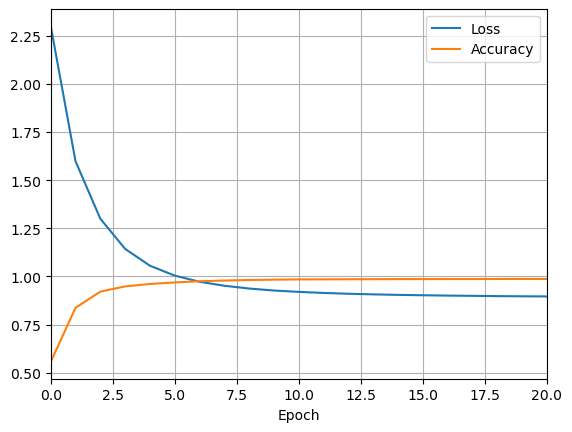

In [34]:
plt.plot(history.epoch,history.history['loss'],label="Loss")
#plt.plot(history.epoch,history.history['sparse_categorical_accuracy'],label="Accuracy")
plt.plot(history.epoch,history.history['adjacent_accuracy'],label="Accuracy")
plt.xlabel('Epoch')
plt.xlim(0,20)
plt.legend()
plt.grid()
plt.show()

Training set demo running on the training data


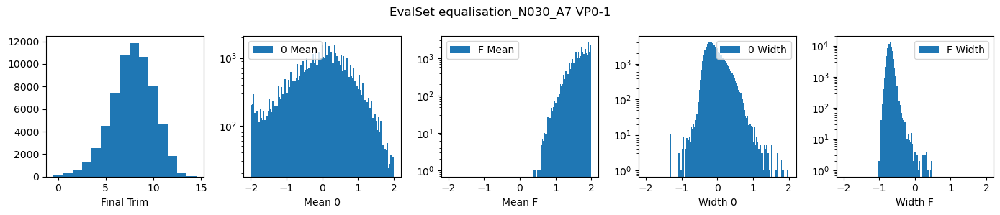

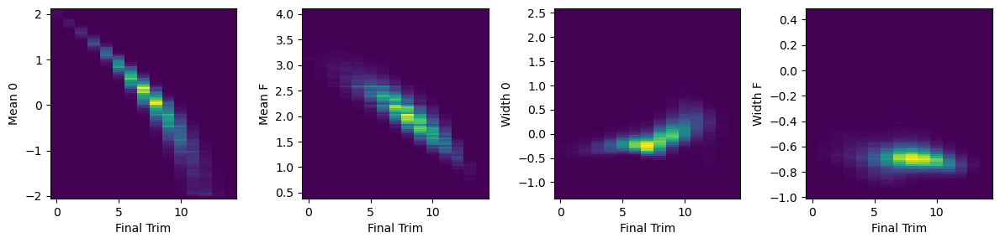

2035/2035 ━━━━━━━━━━━━━━━━━━━━ 2s 772us/step - adjacent_accuracy: 0.9744 - loss: 0.9819 - sparse_categorical_accuracy: 0.5663
Testing data ('equalisation_N030_A7', 'VP0-1') score [0.9687467813491821, 0.5706628561019897, 0.9751586318016052]
2035/2035 ━━━━━━━━━━━━━━━━━━━━ 1s 605us/step
Using predictions directly without offset adjustments.
Confusion Matrix


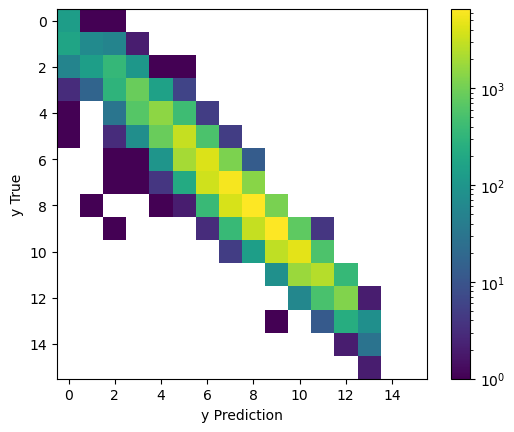

Classification Report
              precision    recall  f1-score   support

           0       0.37      0.99      0.54       136
           1       0.30      0.23      0.26       288
           2       0.47      0.54      0.50       643
           3       0.51      0.64      0.57      1346
           4       0.56      0.57      0.56      2546
           5       0.53      0.66      0.59      4543
           6       0.49      0.56      0.52      7429
           7       0.51      0.53      0.52     10772
           8       0.59      0.55      0.57     11881
           9       0.62      0.61      0.62     10647
          10       0.64      0.57      0.60      8061
          11       0.69      0.53      0.60      4637
          12       0.67      0.68      0.68      1820
          13       0.71      0.24      0.36       331
          14       0.00      0.00      0.00        30
          15       0.00      0.00      0.00         2

    accuracy                           0.57     65112
   m

c:\Users\darre\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\darre\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\darre\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Final Full-Map Accuracy: 97.48% (Pixels within 1 of true value)


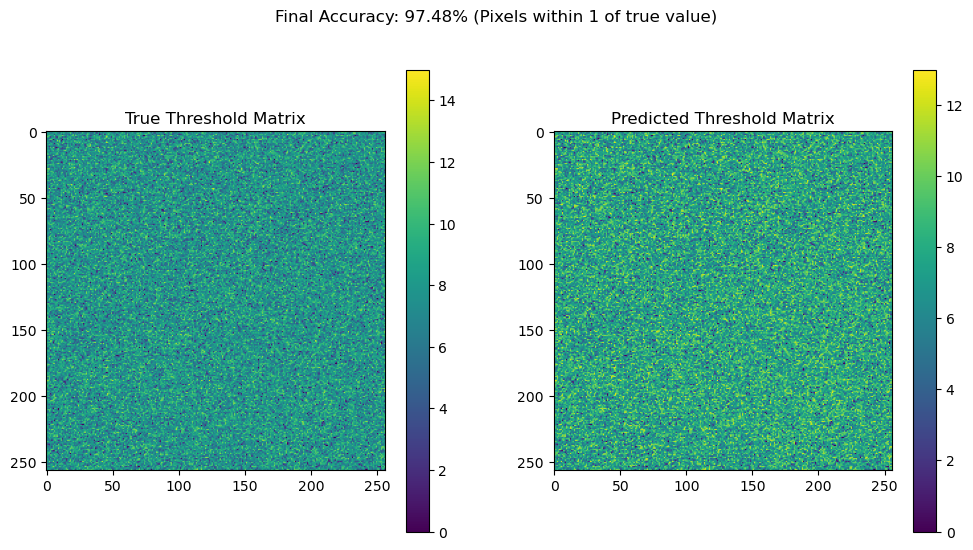

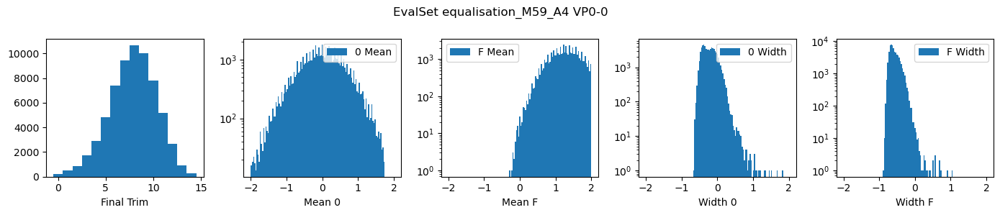

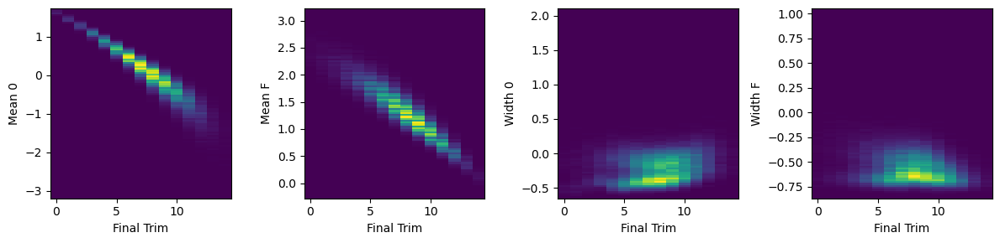

2041/2041 ━━━━━━━━━━━━━━━━━━━━ 2s 766us/step - adjacent_accuracy: 0.9860 - loss: 0.9125 - sparse_categorical_accuracy: 0.5913
Testing data ('equalisation_M59_A4', 'VP0-0') score [0.9243585467338562, 0.5862158536911011, 0.984520435333252]
2041/2041 ━━━━━━━━━━━━━━━━━━━━ 1s 594us/step
Using predictions directly without offset adjustments.
Confusion Matrix


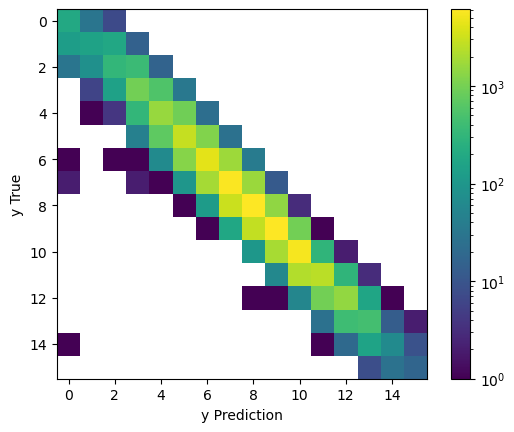

Classification Report
              precision    recall  f1-score   support

           0       0.54      0.84      0.66       232
           1       0.57      0.32      0.41       486
           2       0.48      0.39      0.43       833
           3       0.56      0.57      0.56      1716
           4       0.54      0.56      0.55      2902
           5       0.55      0.59      0.57      4799
           6       0.58      0.58      0.58      7394
           7       0.53      0.61      0.57      9407
           8       0.57      0.56      0.57     10672
           9       0.64      0.61      0.62     10016
          10       0.62      0.69      0.66      7809
          11       0.66      0.49      0.56      5162
          12       0.67      0.56      0.61      2680
          13       0.57      0.50      0.54       892
          14       0.62      0.26      0.36       255
          15       0.61      0.33      0.42        52

    accuracy                           0.59     65307
   m

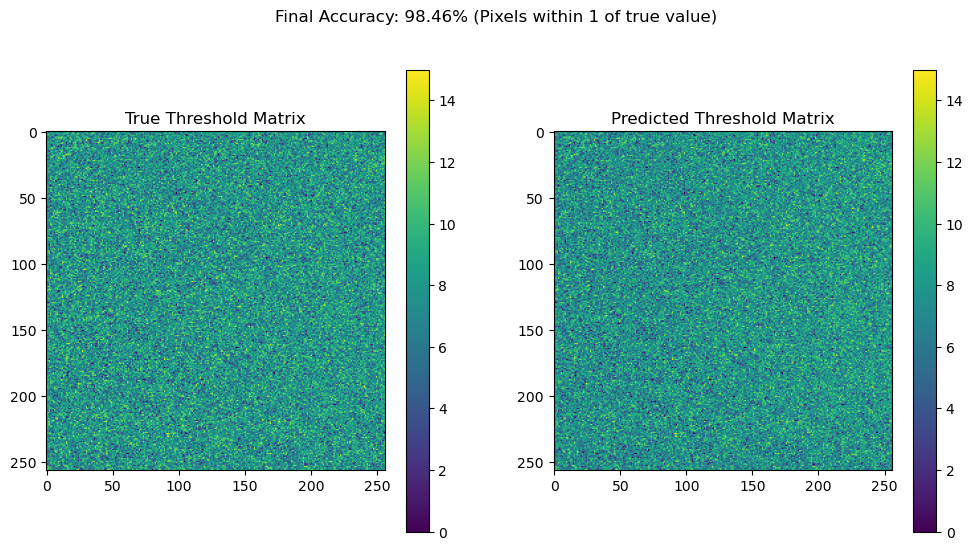

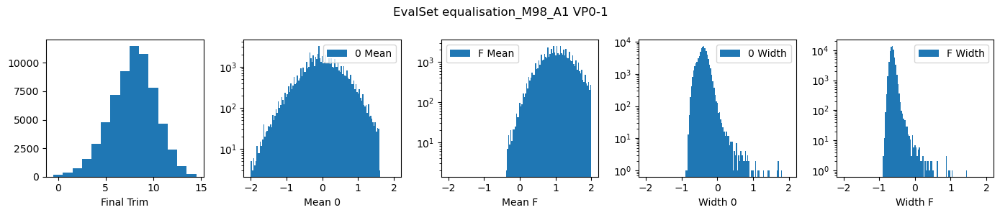

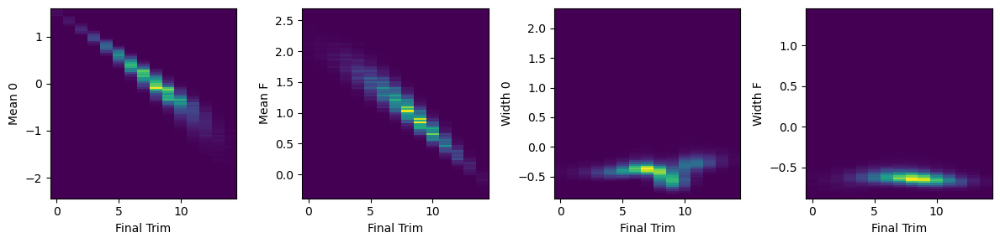

2042/2042 ━━━━━━━━━━━━━━━━━━━━ 2s 791us/step - adjacent_accuracy: 0.9925 - loss: 0.8354 - sparse_categorical_accuracy: 0.6216
Testing data ('equalisation_M98_A1', 'VP0-1') score [0.8496522307395935, 0.6127590537071228, 0.9913687705993652]
2042/2042 ━━━━━━━━━━━━━━━━━━━━ 1s 631us/step
Using predictions directly without offset adjustments.
Confusion Matrix


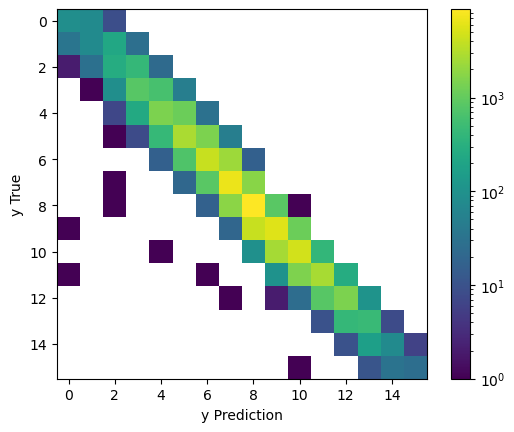

Classification Report
              precision    recall  f1-score   support

           0       0.70      0.51      0.59       176
           1       0.42      0.21      0.28       374
           2       0.44      0.36      0.40       758
           3       0.54      0.52      0.53      1591
           4       0.57      0.51      0.54      2907
           5       0.59      0.59      0.59      4776
           6       0.63      0.57      0.60      7149
           7       0.61      0.72      0.66      9289
           8       0.60      0.77      0.67     11451
           9       0.61      0.52      0.56     10785
          10       0.63      0.60      0.62      7804
          11       0.68      0.59      0.63      4625
          12       0.67      0.60      0.63      2405
          13       0.62      0.51      0.56       911
          14       0.66      0.29      0.40       262
          15       0.82      0.38      0.52        71

    accuracy                           0.61     65334
   m

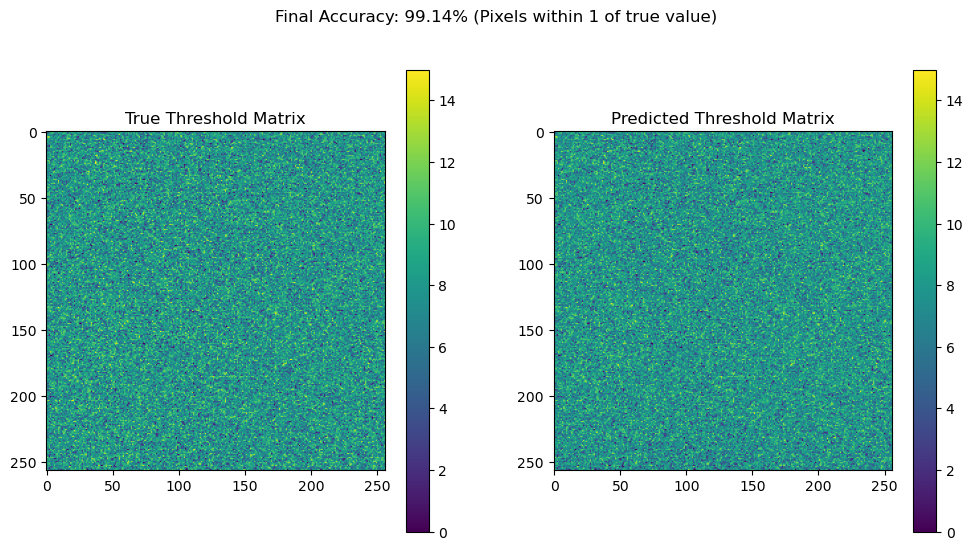

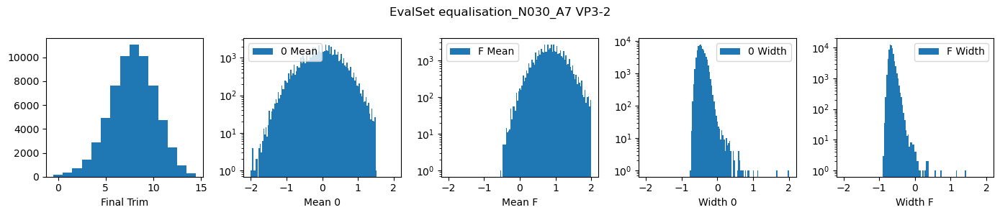

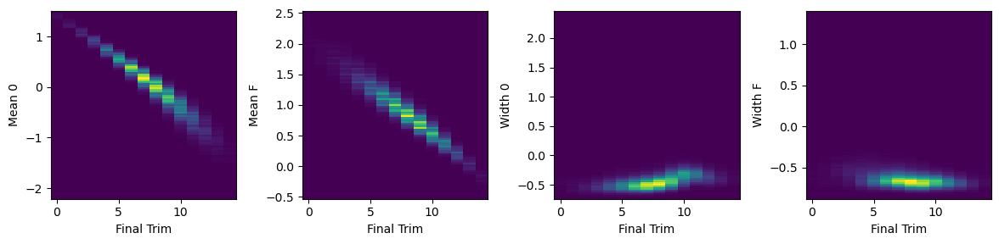

2045/2045 ━━━━━━━━━━━━━━━━━━━━ 2s 747us/step - adjacent_accuracy: 0.9965 - loss: 0.7665 - sparse_categorical_accuracy: 0.6775
Testing data ('equalisation_N030_A7', 'VP3-2') score [0.7575674057006836, 0.6835588216781616, 0.9969131946563721]
2045/2045 ━━━━━━━━━━━━━━━━━━━━ 1s 657us/step
Using predictions directly without offset adjustments.
Confusion Matrix


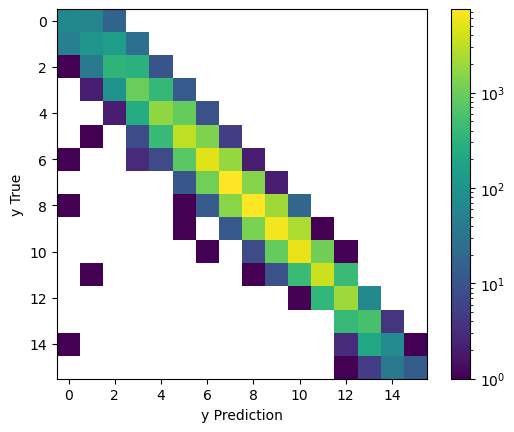

Classification Report
              precision    recall  f1-score   support

           0       0.55      0.46      0.50       140
           1       0.51      0.32      0.40       322
           2       0.56      0.49      0.52       686
           3       0.62      0.66      0.64      1458
           4       0.68      0.59      0.63      2854
           5       0.65      0.65      0.65      4943
           6       0.67      0.66      0.66      7626
           7       0.69      0.74      0.71     10112
           8       0.73      0.67      0.70     11069
           9       0.68      0.63      0.65     10124
          10       0.65      0.74      0.69      7631
          11       0.73      0.81      0.77      4727
          12       0.70      0.82      0.76      2434
          13       0.67      0.58      0.62       952
          14       0.65      0.26      0.37       282
          15       0.93      0.25      0.40        55

    accuracy                           0.68     65415
   m

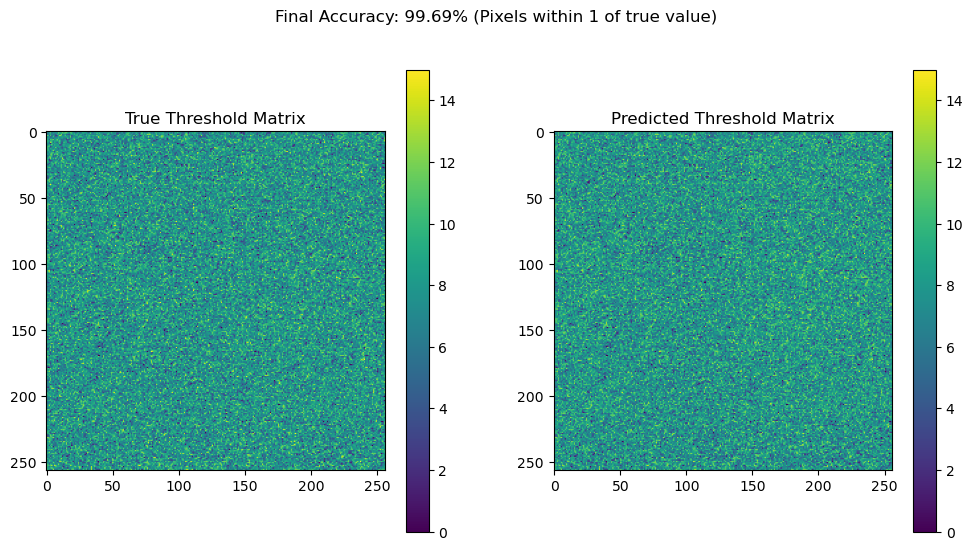

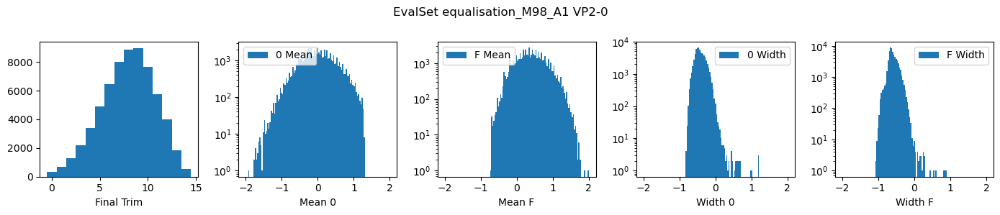

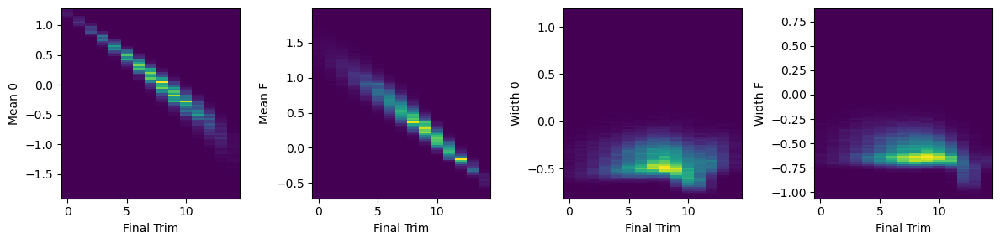

2034/2034 ━━━━━━━━━━━━━━━━━━━━ 2s 760us/step - adjacent_accuracy: 0.9889 - loss: 0.9413 - sparse_categorical_accuracy: 0.5718
Testing data ('equalisation_M98_A1', 'VP2-0') score [0.9497910737991333, 0.5688889622688293, 0.987908661365509]
2034/2034 ━━━━━━━━━━━━━━━━━━━━ 1s 604us/step
Using predictions directly without offset adjustments.
Confusion Matrix


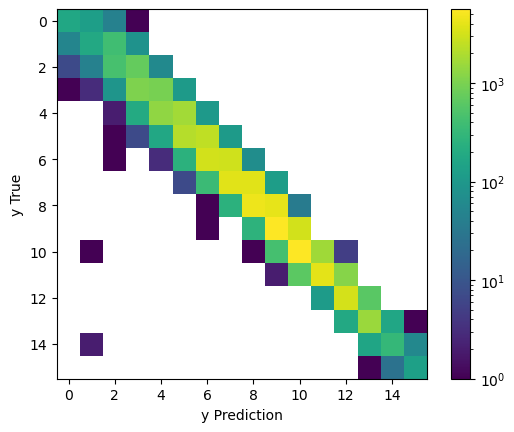

Classification Report
              precision    recall  f1-score   support

           0       0.74      0.49      0.59       343
           1       0.50      0.25      0.34       711
           2       0.46      0.35      0.40      1300
           3       0.51      0.47      0.49      2200
           4       0.53      0.40      0.46      3374
           5       0.51      0.45      0.48      4898
           6       0.52      0.48      0.50      6439
           7       0.53      0.47      0.50      8026
           8       0.52      0.50      0.51      8878
           9       0.54      0.62      0.58      8968
          10       0.60      0.73      0.66      7671
          11       0.69      0.68      0.69      5736
          12       0.70      0.82      0.76      3981
          13       0.66      0.81      0.73      1866
          14       0.62      0.59      0.61       530
          15       0.70      0.83      0.76       162

    accuracy                           0.57     65083
   m

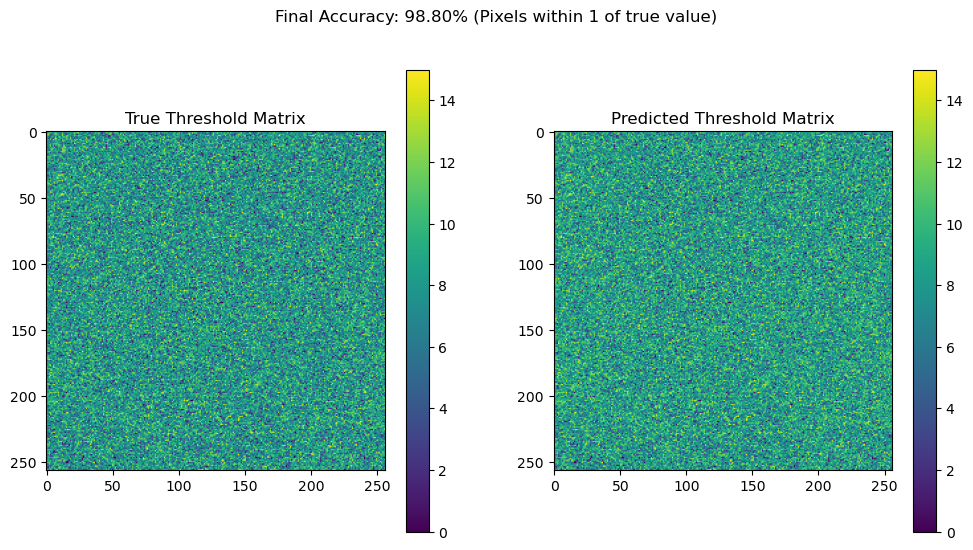

Using ('equalisation_M90_A8', 'VP2-1') as evaluation set


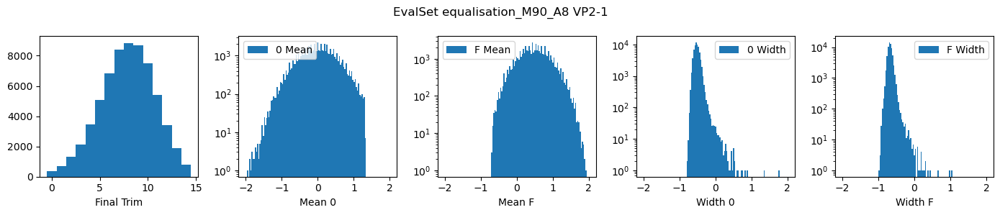

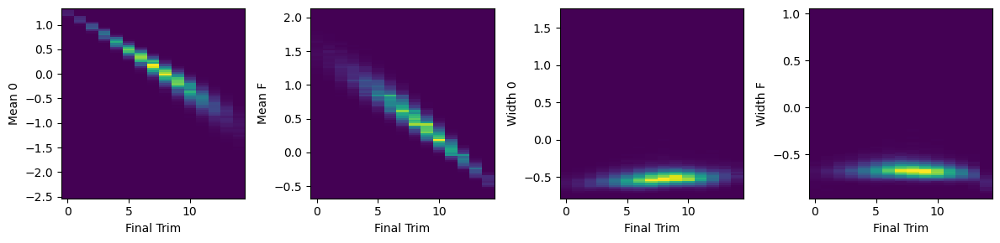

2035/2035 ━━━━━━━━━━━━━━━━━━━━ 2s 795us/step - adjacent_accuracy: 0.9846 - loss: 1.0079 - sparse_categorical_accuracy: 0.5406
Testing data ('equalisation_M90_A8', 'VP2-1') score [0.9424029588699341, 0.5763617753982544, 0.9882985353469849]
2035/2035 ━━━━━━━━━━━━━━━━━━━━ 1s 602us/step
Using predictions directly without offset adjustments.
Confusion Matrix


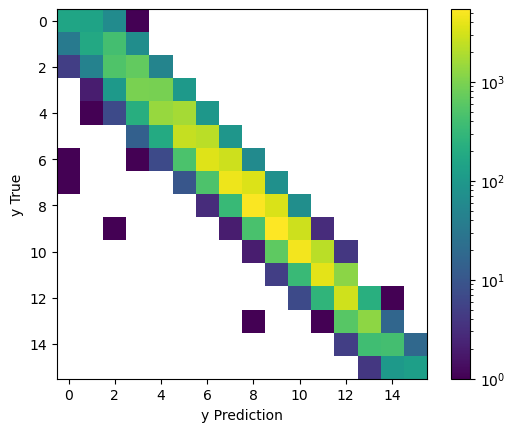

Classification Report
              precision    recall  f1-score   support

           0       0.79      0.42      0.55       370
           1       0.48      0.26      0.34       700
           2       0.46      0.39      0.42      1297
           3       0.49      0.45      0.47      2111
           4       0.54      0.41      0.47      3438
           5       0.53      0.50      0.51      5082
           6       0.56      0.51      0.53      6855
           7       0.58      0.53      0.55      8412
           8       0.57      0.58      0.57      8853
           9       0.57      0.62      0.60      8693
          10       0.59      0.62      0.60      7514
          11       0.61      0.71      0.66      5419
          12       0.62      0.85      0.72      3423
          13       0.68      0.68      0.68      1877
          14       0.77      0.50      0.61       817
          15       0.88      0.55      0.68       237

    accuracy                           0.58     65098
   m

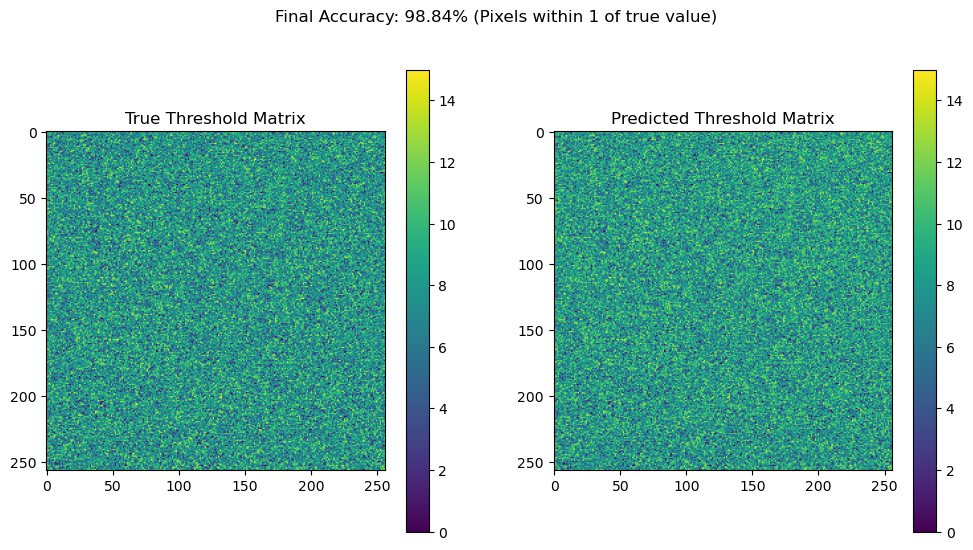

Using ('equalisation_M116_A6', 'VP1-0') as evaluation set


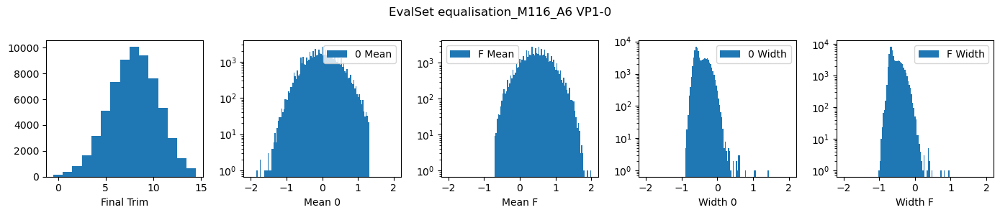

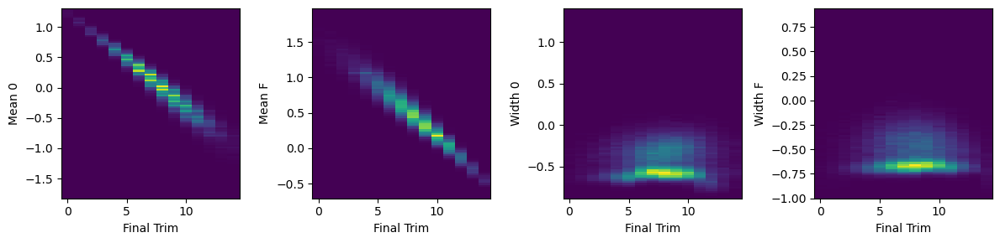

2044/2044 ━━━━━━━━━━━━━━━━━━━━ 2s 892us/step - adjacent_accuracy: 0.9900 - loss: 0.9222 - sparse_categorical_accuracy: 0.5831
Testing data ('equalisation_M116_A6', 'VP1-0') score [0.9055884480476379, 0.5961394309997559, 0.9902458190917969]
2044/2044 ━━━━━━━━━━━━━━━━━━━━ 1s 582us/step
Using predictions directly without offset adjustments.
Confusion Matrix


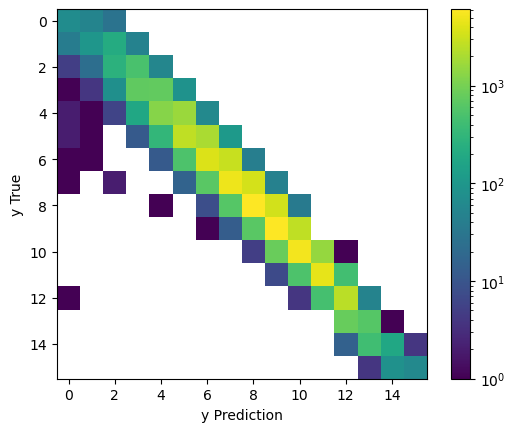

Classification Report
              precision    recall  f1-score   support

           0       0.57      0.47      0.52       149
           1       0.54      0.24      0.34       395
           2       0.45      0.32      0.37       839
           3       0.50      0.44      0.47      1648
           4       0.53      0.40      0.46      3141
           5       0.54      0.52      0.53      5134
           6       0.58      0.52      0.55      7357
           7       0.57      0.54      0.56      9073
           8       0.59      0.60      0.60     10076
           9       0.59      0.65      0.62      9398
          10       0.62      0.69      0.65      7608
          11       0.69      0.82      0.75      5366
          12       0.66      0.83      0.74      3007
          13       0.56      0.43      0.49      1413
          14       0.69      0.29      0.41       628
          15       0.94      0.41      0.58       147

    accuracy                           0.60     65379
   m

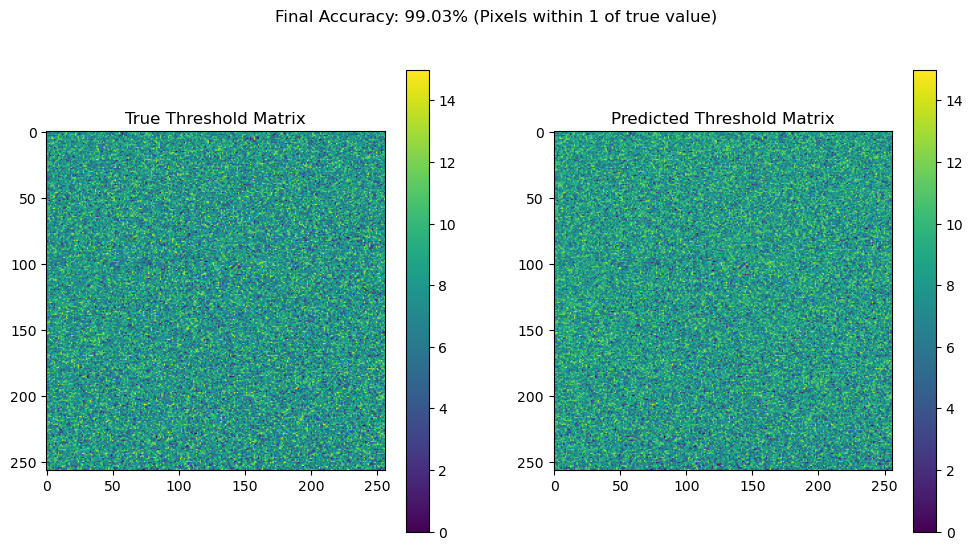

Using ('equalisation_M94_A2', 'VP2-2') as evaluation set


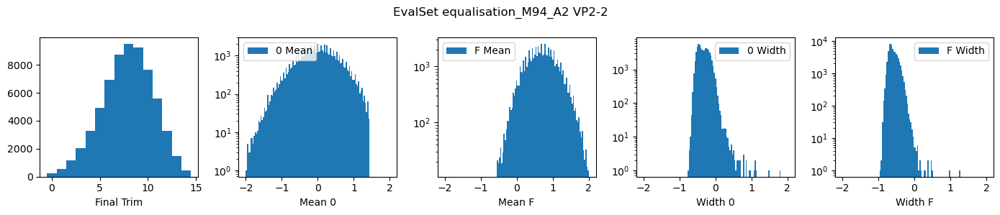

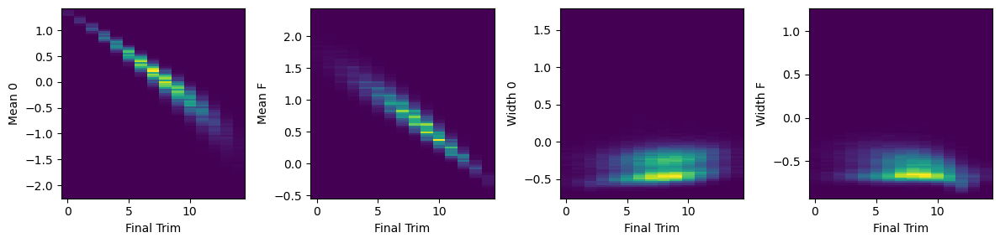

2037/2037 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - adjacent_accuracy: 0.9902 - loss: 0.9127 - sparse_categorical_accuracy: 0.5874
Testing data ('equalisation_M94_A2', 'VP2-2') score [0.8640316128730774, 0.6170183420181274, 0.9923601150512695]
2037/2037 ━━━━━━━━━━━━━━━━━━━━ 1s 644us/step
Using predictions directly without offset adjustments.
Confusion Matrix


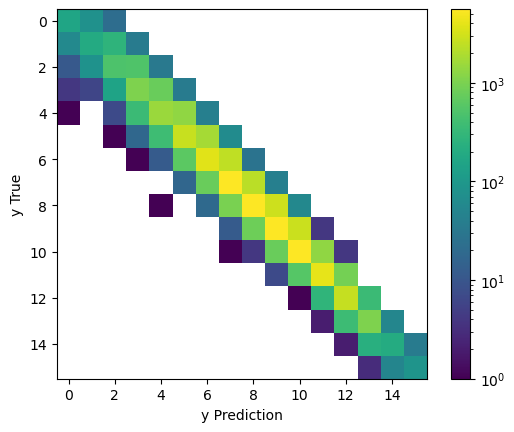

Classification Report
              precision    recall  f1-score   support

           0       0.68      0.61      0.64       260
           1       0.54      0.35      0.42       567
           2       0.53      0.44      0.48      1153
           3       0.53      0.52      0.53      2052
           4       0.56      0.47      0.51      3266
           5       0.57      0.54      0.56      4917
           6       0.59      0.55      0.57      6904
           7       0.61      0.64      0.63      8716
           8       0.64      0.59      0.61      9490
           9       0.60      0.61      0.60      9241
          10       0.62      0.72      0.66      7670
          11       0.71      0.73      0.72      5582
          12       0.67      0.80      0.73      3263
          13       0.64      0.71      0.67      1471
          14       0.67      0.43      0.52       472
          15       0.71      0.62      0.66       141

    accuracy                           0.62     65165
   m

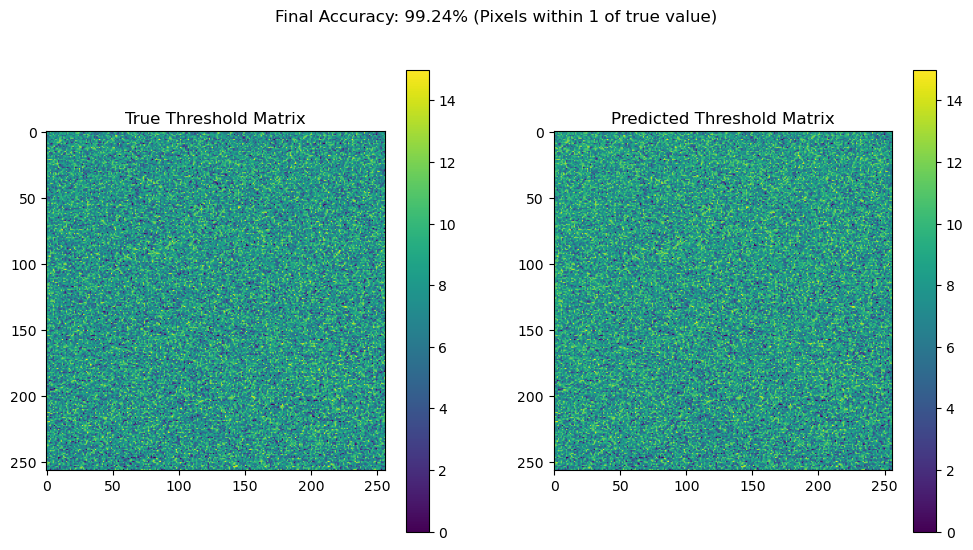

Using ('equalisation_M96_A3', 'VP0-2') as evaluation set


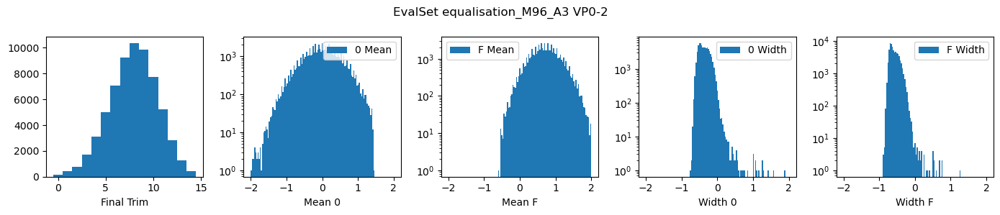

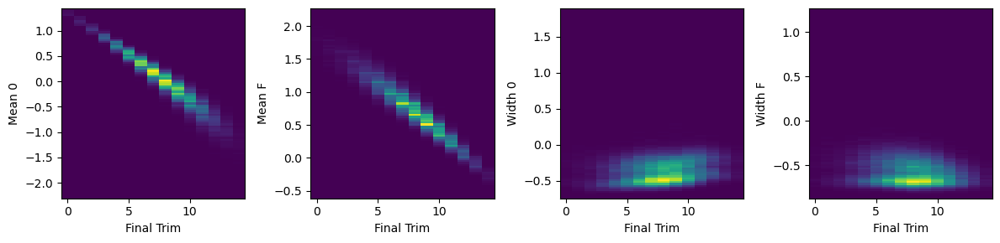

2043/2043 ━━━━━━━━━━━━━━━━━━━━ 2s 858us/step - adjacent_accuracy: 0.9946 - loss: 0.8322 - sparse_categorical_accuracy: 0.6334
Testing data ('equalisation_M96_A3', 'VP0-2') score [0.8175817728042603, 0.643826425075531, 0.9950593709945679]
2043/2043 ━━━━━━━━━━━━━━━━━━━━ 2s 748us/step
Using predictions directly without offset adjustments.
Confusion Matrix


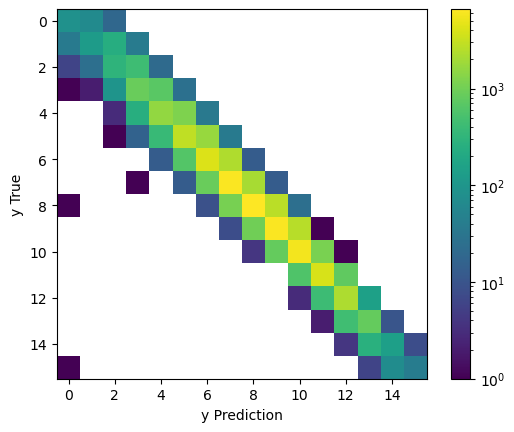

Classification Report
              precision    recall  f1-score   support

           0       0.65      0.50      0.57       174
           1       0.56      0.28      0.37       443
           2       0.46      0.39      0.42       785
           3       0.54      0.52      0.53      1703
           4       0.59      0.52      0.55      3094
           5       0.60      0.57      0.59      4999
           6       0.61      0.58      0.60      7063
           7       0.65      0.67      0.66      9223
           8       0.68      0.64      0.66     10359
           9       0.65      0.64      0.64      9873
          10       0.64      0.74      0.69      7743
          11       0.72      0.74      0.73      5255
          12       0.65      0.80      0.72      2832
          13       0.67      0.65      0.66      1285
          14       0.64      0.34      0.45       418
          15       0.83      0.34      0.48       118

    accuracy                           0.64     65367
   m

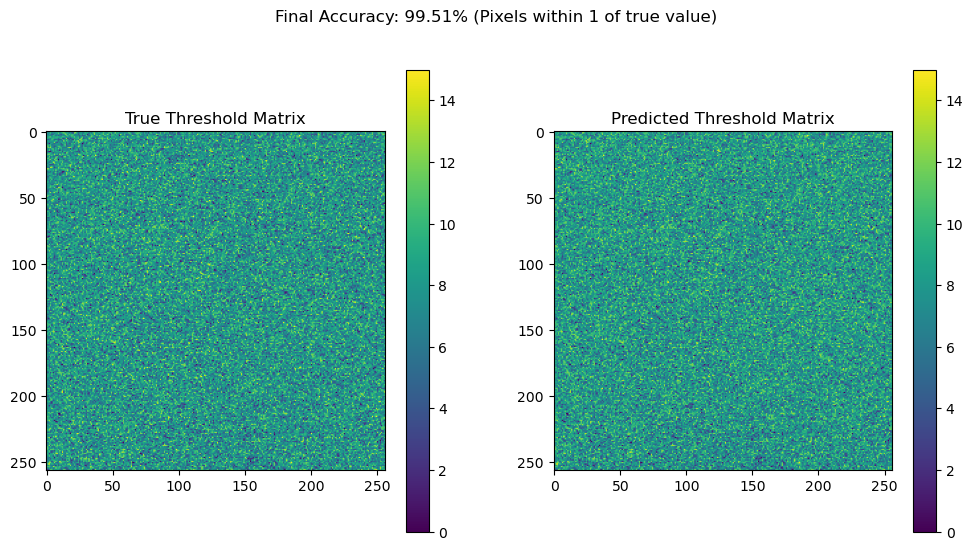

Using ('equalisation_M59_A4', 'VP3-2') as evaluation set


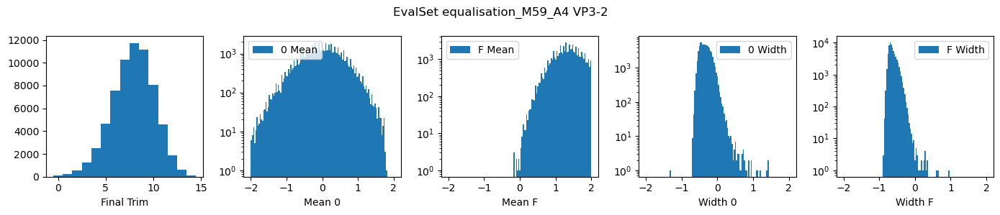

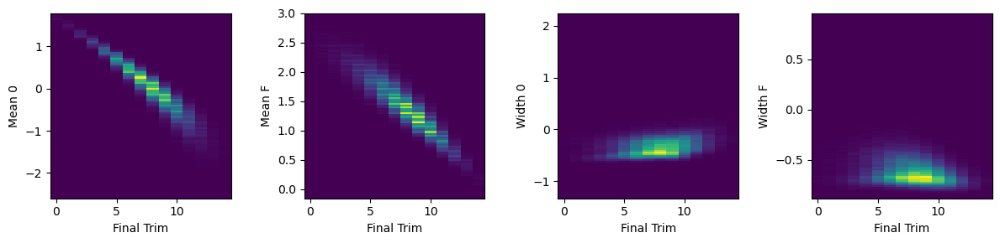

2045/2045 ━━━━━━━━━━━━━━━━━━━━ 2s 700us/step - adjacent_accuracy: 0.9914 - loss: 0.8436 - sparse_categorical_accuracy: 0.6241
Testing data ('equalisation_M59_A4', 'VP3-2') score [0.8913687467575073, 0.5975913405418396, 0.9878149628639221]
2045/2045 ━━━━━━━━━━━━━━━━━━━━ 1s 590us/step
Using predictions directly without offset adjustments.
Confusion Matrix


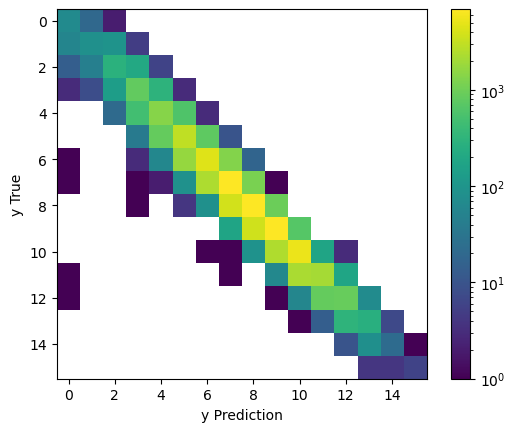

Classification Report
              precision    recall  f1-score   support

           0       0.47      0.76      0.58        91
           1       0.54      0.36      0.43       239
           2       0.53      0.51      0.52       557
           3       0.53      0.64      0.58      1270
           4       0.53      0.56      0.55      2531
           5       0.56      0.64      0.60      4679
           6       0.59      0.59      0.59      7580
           7       0.56      0.65      0.60     10288
           8       0.58      0.59      0.59     11752
           9       0.66      0.60      0.63     11184
          10       0.64      0.67      0.66      8038
          11       0.67      0.46      0.54      4614
          12       0.64      0.47      0.54      1878
          13       0.63      0.44      0.52       600
          14       0.67      0.19      0.30       116
          15       0.86      0.43      0.57        14

    accuracy                           0.60     65431
   m

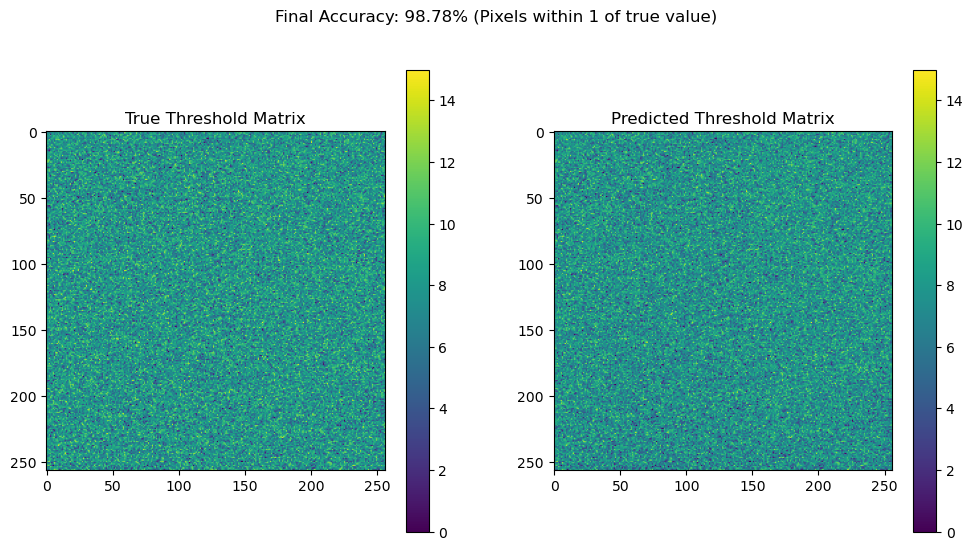

Using ('equalisation_M96_A3', 'VP2-2') as evaluation set


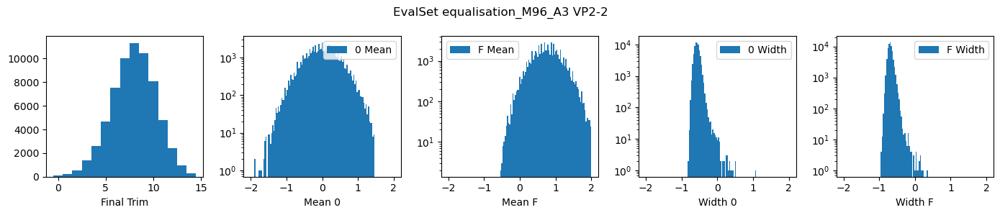

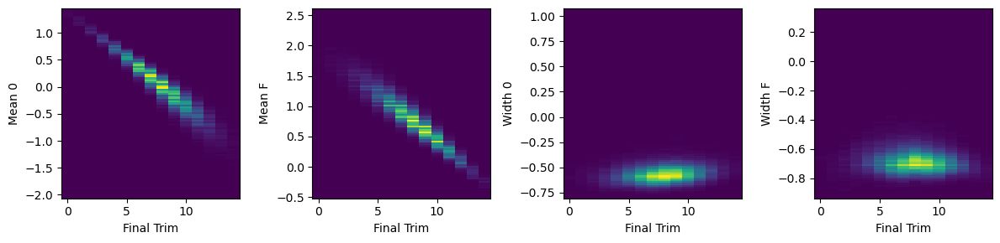

2046/2046 ━━━━━━━━━━━━━━━━━━━━ 1s 688us/step - adjacent_accuracy: 0.9928 - loss: 0.8257 - sparse_categorical_accuracy: 0.6422
Testing data ('equalisation_M96_A3', 'VP2-2') score [0.8291753530502319, 0.6382539868354797, 0.9924089908599854]
2046/2046 ━━━━━━━━━━━━━━━━━━━━ 2s 777us/step
Using predictions directly without offset adjustments.
Confusion Matrix


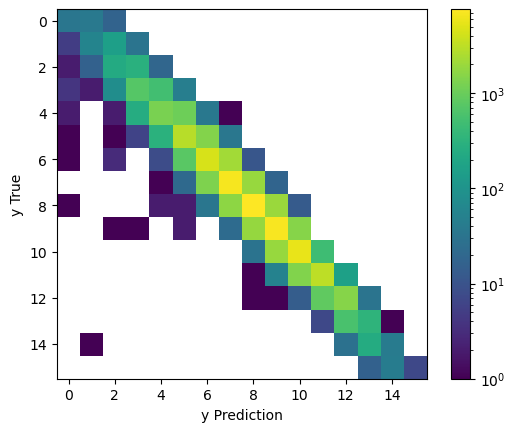

Classification Report
              precision    recall  f1-score   support

           0       0.67      0.38      0.49        87
           1       0.50      0.23      0.31       250
           2       0.47      0.42      0.45       560
           3       0.55      0.53      0.54      1362
           4       0.60      0.48      0.53      2604
           5       0.60      0.61      0.61      4697
           6       0.61      0.60      0.60      7528
           7       0.63      0.67      0.65     10031
           8       0.67      0.67      0.67     11335
           9       0.64      0.68      0.66     10438
          10       0.66      0.70      0.68      8065
          11       0.70      0.66      0.68      4787
          12       0.66      0.63      0.64      2398
          13       0.54      0.36      0.43       931
          14       0.48      0.13      0.21       313
          15       1.00      0.11      0.19        66

    accuracy                           0.64     65452
   m

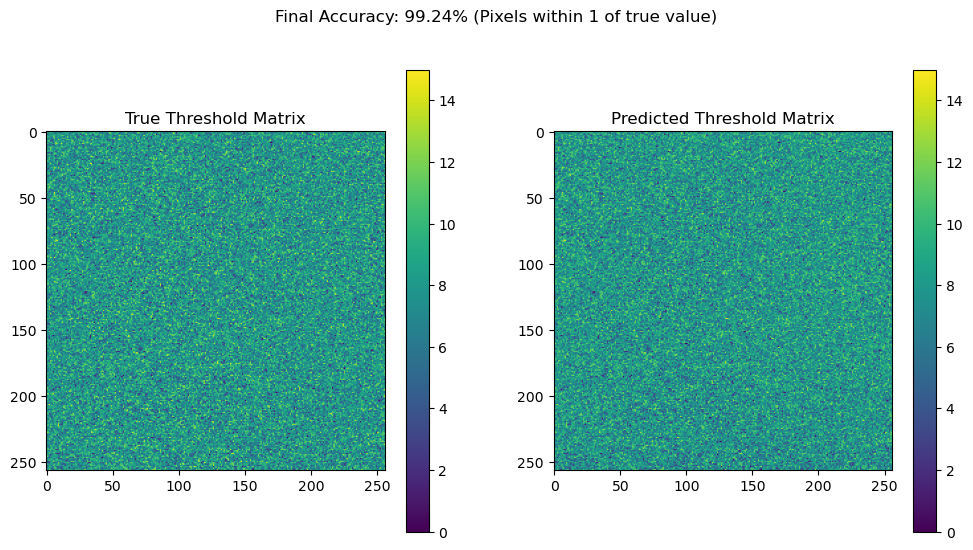

Using ('equalisation_M59_A4', 'VP1-0') as evaluation set


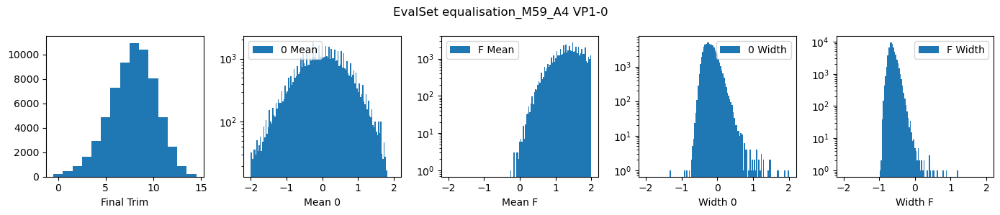

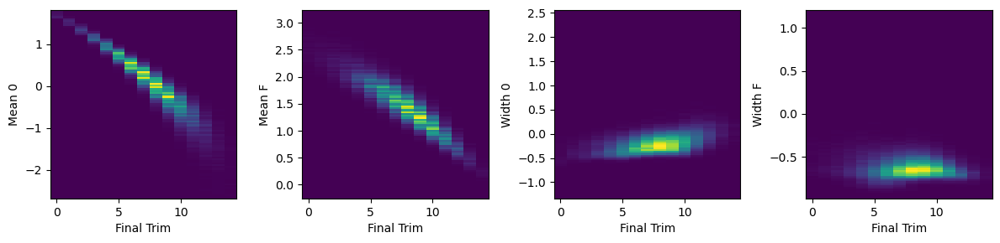

2043/2043 ━━━━━━━━━━━━━━━━━━━━ 1s 709us/step - adjacent_accuracy: 0.9888 - loss: 0.8784 - sparse_categorical_accuracy: 0.6076
Testing data ('equalisation_M59_A4', 'VP1-0') score [0.9204301834106445, 0.5912714600563049, 0.9828224182128906]
2043/2043 ━━━━━━━━━━━━━━━━━━━━ 1s 602us/step
Using predictions directly without offset adjustments.
Confusion Matrix


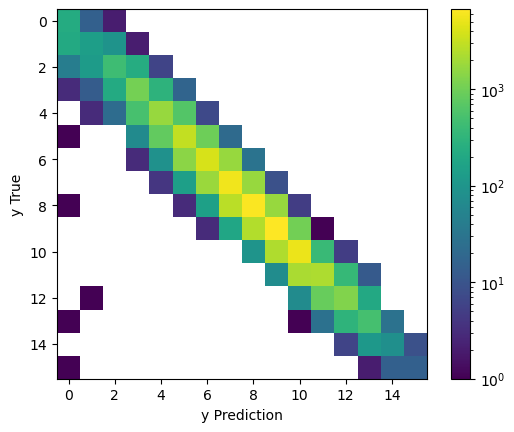

Classification Report
              precision    recall  f1-score   support

           0       0.47      0.93      0.62       242
           1       0.47      0.32      0.38       445
           2       0.56      0.51      0.54       845
           3       0.56      0.66      0.61      1608
           4       0.59      0.60      0.60      2938
           5       0.57      0.62      0.59      4865
           6       0.58      0.54      0.56      7251
           7       0.55      0.60      0.57      9333
           8       0.60      0.58      0.59     10955
           9       0.62      0.65      0.63     10426
          10       0.61      0.65      0.63      8022
          11       0.64      0.46      0.53      4886
          12       0.65      0.53      0.58      2432
          13       0.60      0.58      0.59       860
          14       0.66      0.39      0.49       208
          15       0.62      0.45      0.53        33

    accuracy                           0.59     65349
   m

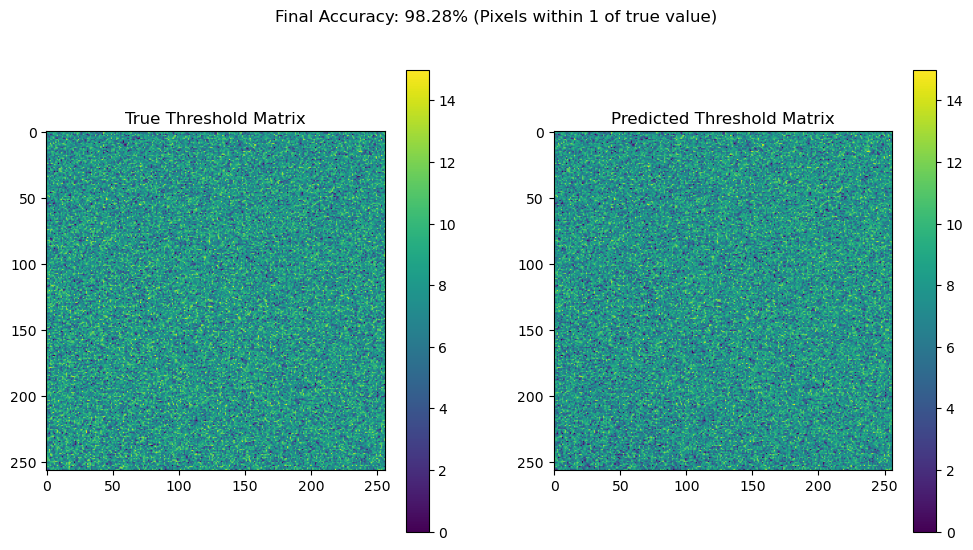

Using ('equalisation_M90_A8', 'VP2-2') as evaluation set


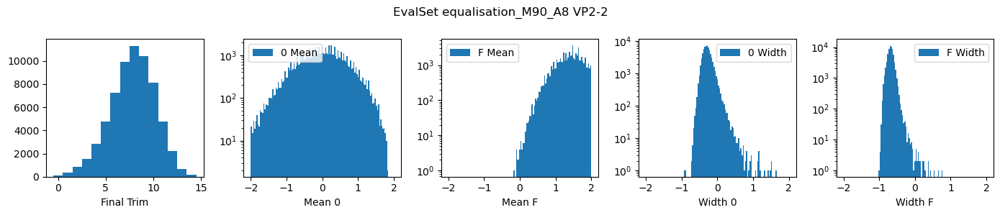

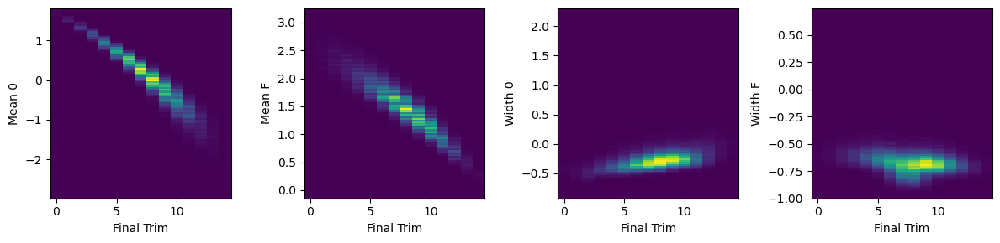

2044/2044 ━━━━━━━━━━━━━━━━━━━━ 2s 863us/step - adjacent_accuracy: 0.9931 - loss: 0.7910 - sparse_categorical_accuracy: 0.6536
Testing data ('equalisation_M90_A8', 'VP2-2') score [0.8272091150283813, 0.6348565220832825, 0.9901846647262573]
2044/2044 ━━━━━━━━━━━━━━━━━━━━ 1s 559us/step
Using predictions directly without offset adjustments.
Confusion Matrix


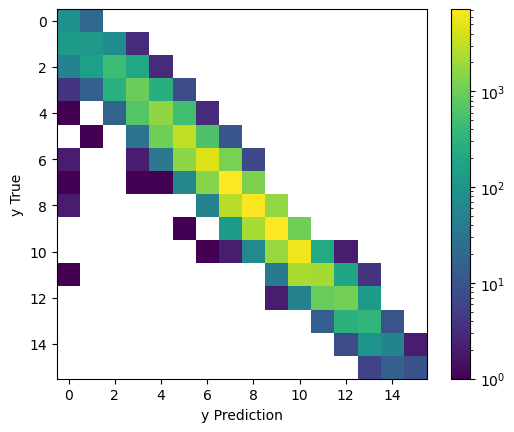

Classification Report
              precision    recall  f1-score   support

           0       0.32      0.82      0.46       112
           1       0.40      0.37      0.38       327
           2       0.55      0.53      0.54       863
           3       0.51      0.62      0.56      1542
           4       0.55      0.58      0.56      2810
           5       0.59      0.65      0.62      4760
           6       0.68      0.61      0.64      7277
           7       0.64      0.72      0.68      9954
           8       0.65      0.60      0.62     11321
           9       0.66      0.67      0.66     10422
          10       0.64      0.74      0.68      8135
          11       0.66      0.46      0.54      4775
          12       0.69      0.51      0.59      2223
          13       0.60      0.52      0.56       674
          14       0.69      0.34      0.45       163
          15       0.82      0.30      0.44        30

    accuracy                           0.63     65388
   m

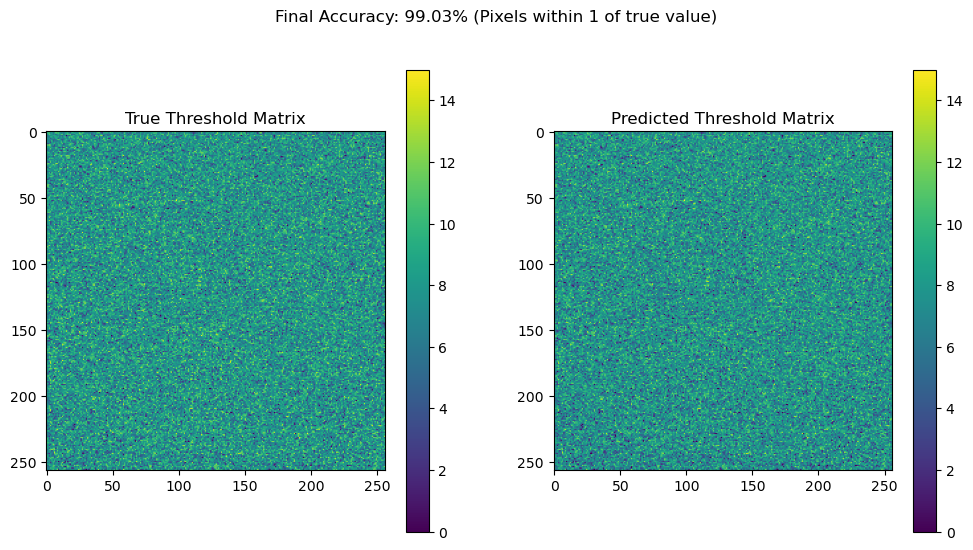

Using ('equalisation_M116_A6', 'VP3-1') as evaluation set


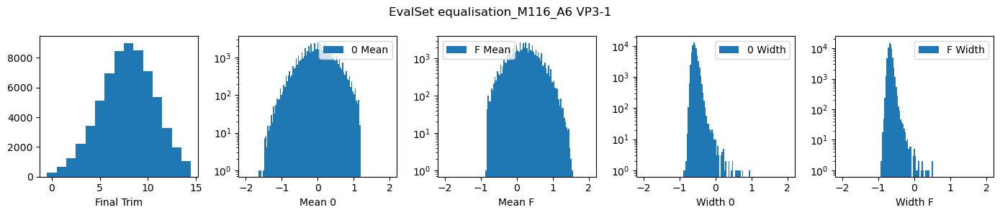

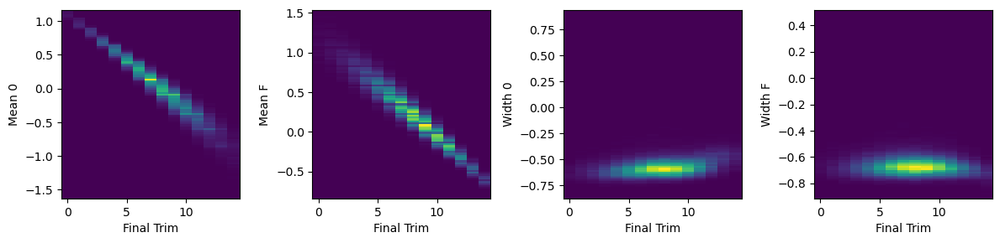

2034/2034 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - adjacent_accuracy: 0.9529 - loss: 1.4441 - sparse_categorical_accuracy: 0.3251
Testing data ('equalisation_M116_A6', 'VP3-1') score [1.2517544031143188, 0.4135816693305969, 0.9703017473220825]
2034/2034 ━━━━━━━━━━━━━━━━━━━━ 1s 708us/step
Using predictions directly without offset adjustments.
Confusion Matrix


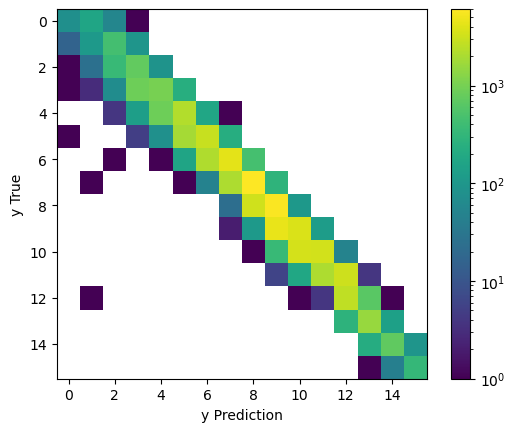

Classification Report
              precision    recall  f1-score   support

           0       0.80      0.26      0.39       297
           1       0.36      0.16      0.23       672
           2       0.38      0.29      0.32      1221
           3       0.47      0.40      0.43      2214
           4       0.42      0.26      0.32      3422
           5       0.42      0.36      0.39      5132
           6       0.40      0.30      0.34      6952
           7       0.32      0.24      0.28      8447
           8       0.33      0.36      0.34      9010
           9       0.42      0.54      0.47      8509
          10       0.46      0.48      0.47      7122
          11       0.38      0.39      0.38      5373
          12       0.43      0.80      0.56      3298
          13       0.64      0.79      0.71      1985
          14       0.80      0.70      0.74      1040
          15       0.78      0.88      0.83       379

    accuracy                           0.41     65073
   m

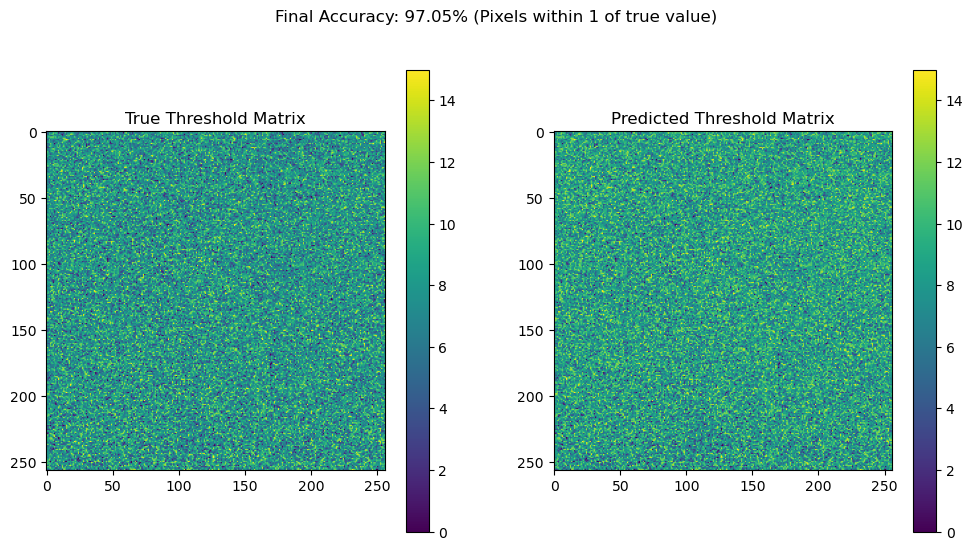

Using ('equalisation_N22_A5', 'VP2-1') as evaluation set


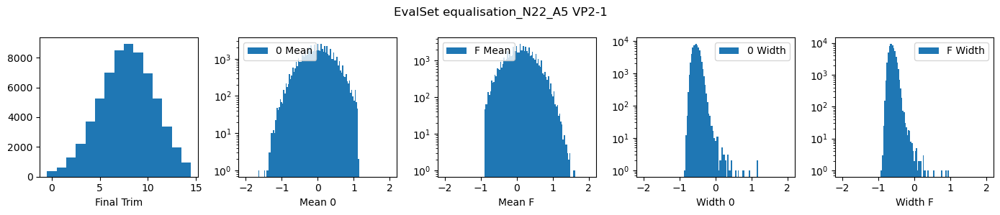

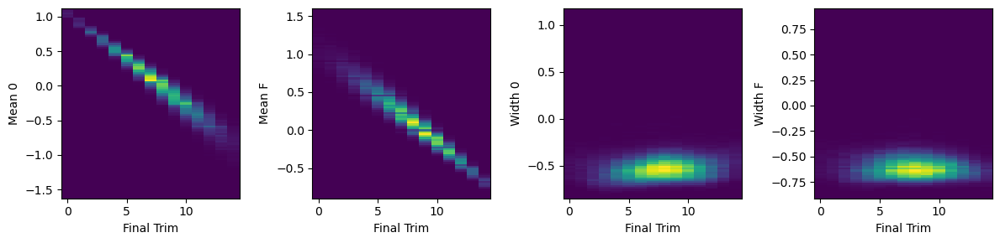

2032/2032 ━━━━━━━━━━━━━━━━━━━━ 2s 884us/step - adjacent_accuracy: 0.9261 - loss: 1.5978 - sparse_categorical_accuracy: 0.2683
Testing data ('equalisation_N22_A5', 'VP2-1') score [1.4309366941452026, 0.332912802696228, 0.9468811750411987]
2032/2032 ━━━━━━━━━━━━━━━━━━━━ 1s 667us/step
Using predictions directly without offset adjustments.
Confusion Matrix


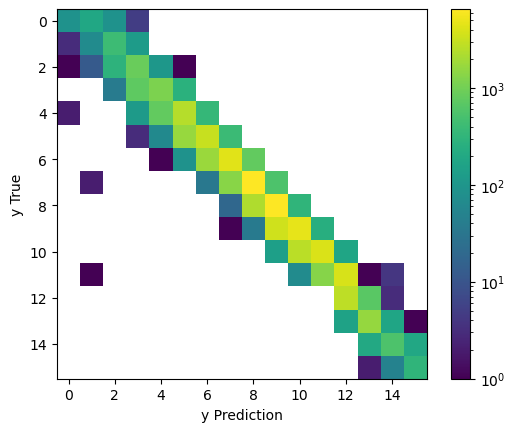

Classification Report
              precision    recall  f1-score   support

           0       0.94      0.23      0.38       371
           1       0.25      0.11      0.16       614
           2       0.35      0.23      0.28      1281
           3       0.40      0.34      0.36      2189
           4       0.38      0.21      0.27      3710
           5       0.37      0.32      0.35      5246
           6       0.33      0.25      0.28      6994
           7       0.22      0.16      0.19      8471
           8       0.24      0.25      0.24      8918
           9       0.33      0.41      0.37      8368
          10       0.35      0.38      0.36      6945
          11       0.24      0.26      0.25      5238
          12       0.39      0.80      0.53      3380
          13       0.65      0.83      0.73      1956
          14       0.71      0.59      0.64       956
          15       0.62      0.86      0.72       362

    accuracy                           0.33     64999
   m

In [ ]:
import keras
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from matplotlib import pyplot as plt
from matplotlib.colors import LogNorm
import csv
import time

# Define training data set, slot post then ASIC
custom_objects = {"adjacent_accuracy": adjacent_accuracy}
loadFile = f"NN_{trainingSet[0][0]}_{trainingSet[0][1]}.keras"
loadModel = keras.saving.load_model(loadFile, custom_objects=custom_objects)

results = []

# Process each dataset in the evaluation set
evalSets = []  # To store processed evaluation dataset

def rebuild_full_prediction(dSet, best_y_pred, tgzFileName):
    """
    Reconstruct a 256x256 prediction array by re-inserting the predictions 
    from the filtered set. Pixels that were dropped (due to mask != 0 or any NaN)
    will be predicted as 0.
    
    Parameters:
      dSet: tuple (e.g., (modulePath, vp))
      best_y_pred: 1D NumPy array of predictions for the filtered (good) pixels
      tgzFileName: string; the path to the tar.gz file containing the CSVs
    
    Returns:
      full_prediction: a 256x256 NumPy array with predictions inserted at valid positions.
    """
    import tarfile
    import numpy as np
    
    path = dSet[0] + "/"
    
    # Load all arrays that were used for filtering
    with tarfile.open(tgzFileName, 'r:gz') as tgz:
        full_mask = loadTGZ(tgz, path + f"Module0_{dSet[1]}_Matrix_Mask.csv", np.float16)
        tMean0   = loadTGZ(tgz, path + f"Module0_{dSet[1]}_Trim0_Noise_Mean.csv", np.float16)
        tMeanF   = loadTGZ(tgz, path + f"Module0_{dSet[1]}_TrimF_Noise_Mean.csv", np.float16)
        tWidth0  = loadTGZ(tgz, path + f"Module0_{dSet[1]}_Trim0_Noise_Width.csv", np.float16)
        tWidthF  = loadTGZ(tgz, path + f"Module0_{dSet[1]}_TrimF_Noise_Width.csv", np.float16)
    
    # Ensure that each array is 2D (256x256); reshape if necessary.
    arrays = [full_mask, tMean0, tMeanF, tWidth0, tWidthF]
    for i, arr in enumerate(arrays):
        if arr.ndim == 1:
            try:
                arrays[i] = arr.reshape((256, 256))
            except Exception as e:
                raise ValueError(f"Error reshaping array {i}: {e}")
    full_mask, tMean0, tMeanF, tWidth0, tWidthF = arrays
    
    # Recompute the filtering mask exactly as in removeMaskNaN:
    aMask = (full_mask == 0)
    for arr in [tMean0, tMeanF, tWidth0, tWidthF]:
        aMask &= ~np.isnan(arr)
    
    # Get the valid pixel positions as row and column indices.
    valid_rows, valid_cols = np.where(aMask)
    total_valid = len(valid_rows)
    num_predictions = best_y_pred.shape[0]
    
    # Create a full 256x256 array filled with 0's.
    full_prediction = np.zeros((256, 256), dtype=best_y_pred.dtype)
    
    if num_predictions > total_valid:
        raise ValueError("More predictions than valid pixels!")
    elif num_predictions < total_valid:
        # Some valid pixels (e.g. those with NaN in some fields) did not get a prediction.
        # We'll assume the predictions correspond to the first num_predictions valid pixels,
        # and leave the rest as 0.
        rows_to_fill = valid_rows[:num_predictions]
        cols_to_fill = valid_cols[:num_predictions]
    else:
        rows_to_fill = valid_rows
        cols_to_fill = valid_cols
    
    full_prediction[rows_to_fill, cols_to_fill] = best_y_pred
    return full_prediction

def load_full_true_matrix(dSet, tgzFileName):
    """
    Load the full 256x256 true threshold matrix from the tar.gz file.
    """
    path = dSet[0] + "/"
    with tarfile.open(tgzFileName, 'r:gz') as tgz:
        true_matrix = loadTGZ(tgz, path + f"Module0_{dSet[1]}_Matrix_Trim.csv", np.int8)
        true_matrix = true_matrix.reshape((256, 256))
    return true_matrix

def evalNN(eval, plot=True):
    evalSet = extractFromTGZ(tgzFileName, eval)  # Load an evaluation set
    evalSet = removeMaskNaN(evalSet)             # Clean set
    evalSet = normSet(evalSet)                   # Normalize the input data
    if plot:
        drawSet(evalSet, f'EvalSet {eval[0]} {eval[1]}', True)  # Optionally plot the set
    
    # Prepare input features and true labels
    x = np.column_stack([evalSet["tMean0"], evalSet["tMeanF"], 
                         evalSet["tWidth0"], evalSet["tWidthF"]])
    y_true = evalSet["trim"]
    
    # Evaluate the model on the evaluation set
    score = loadModel.evaluate(x, y_true)
    print("Testing data", eval, "score", score)
    
    # Time the prediction call
    y_pred = loadModel.predict(x)
    loss, adj_accuracy = score[0], score[2]
    
    # Get discrete predicted classes (without any offset adjustment)
    y_pred_best = np.argmax(y_pred, axis=1)
    print("Using predictions directly without offset adjustments.")
    
    # Plot confusion matrix using the direct predictions
    print('Confusion Matrix')
    im = plt.imshow(confusion_matrix(y_true, y_pred_best), norm=LogNorm())
    plt.colorbar(im)
    plt.xlabel("y Prediction")
    plt.ylabel("y True")
    plt.show()
    
    # Print classification report
    print('Classification Report')
    print(classification_report(y_true, y_pred_best))
    
    # Rebuild the full 256x256 predicted matrix using y_pred_best
    try:
        full_pred_matrix = rebuild_full_prediction(eval, y_pred_best, tgzFileName)
    except Exception as e:
        print("Error in rebuilding full prediction matrix:", e)
        return
    
    # Load the full true threshold matrix
    try:
        full_true_matrix = load_full_true_matrix(eval, tgzFileName)
    except Exception as e:
        print("Error in loading full true matrix:", e)
        return
    
    # Compute final accuracy: percentage of pixels with |predicted - true| <= 1
    final_accuracy = np.mean(np.abs(full_pred_matrix - full_true_matrix) <= 1) * 100
    print(f"Final Full-Map Accuracy: {final_accuracy:.2f}% (Pixels within 1 of true value)")
    
    # Plot the True and Predicted Matrices side by side
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    im0 = axes[0].imshow(full_true_matrix, cmap='viridis')
    axes[0].set_title("True Threshold Matrix")
    plt.colorbar(im0, ax=axes[0])
    
    im1 = axes[1].imshow(full_pred_matrix, cmap='viridis')
    axes[1].set_title("Predicted Threshold Matrix")
    plt.colorbar(im1, ax=axes[1])
    
    plt.suptitle(f"Final Accuracy: {final_accuracy:.2f}% (Pixels within 1 of true value)")
    plt.show()
    
    results.append({
        "Dataset": f"{eval[0]}-{eval[1]}",
        "Loss": loss,
        "Accuracy": adj_accuracy,
        "Batch Size": "512"
    })

print("Training set demo running on the training data")
for train_data in trainingSet:  #iterate over each training dataset
    evalNN(train_data, True)

import random

random_eval_sets = random.sample(evaluationSet, 30)  #select random datasets

for s in random_eval_sets:
    print("Using",s,"as evaluation set")
    evalNN(s, True)

import os

csv_file = "evaluation_results_param_tuning.csv"
fieldnames = ["Dataset", "Loss", "Accuracy", "Best Offset", "Batch Size"]
    
# Check if the file exists
if os.path.exists(csv_file):
    mode = 'a'
    write_header = False
else:
    mode = 'w'
    write_header = True

with open(csv_file, mode=mode, newline='') as file:
    writer = csv.DictWriter(file, fieldnames=fieldnames)
    if write_header:
        writer.writeheader()
    writer.writerows(results)

print(f"Results saved to {csv_file}")